<a href="https://colab.research.google.com/github/aziegert/Regression_fiber_opitc_sensors/blob/main/Regresja_projekt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Imports

In [1]:
!pip install pandas_profiling --upgrade
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 KB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 344.5/344.5 KB 20.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 KB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 2.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=067fccbc099aa2a3dc2647317617d2d8a55df4268c5eeca7655688cb47d22f8e
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
Successfully built htmlmin
  Attemp

In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

<ipython-input-2-c3080d7f82ff>:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


# EDA

# Loading data

In [4]:
df = pd.read_csv('winequality-red.csv')

In [5]:
df.sample(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1288,7.0,0.600,0.30,4.5,0.068,20.0,110.0,0.99914,3.30,1.17,10.2,5
892,10.1,0.450,0.23,1.9,0.082,10.0,18.0,0.99774,3.22,0.65,9.3,6
480,10.6,0.280,0.39,15.5,0.069,6.0,23.0,1.00260,3.12,0.66,9.2,5
133,6.6,0.500,0.01,1.5,0.060,17.0,26.0,0.99520,3.40,0.58,9.8,6
1574,5.6,0.310,0.78,13.9,0.074,23.0,92.0,0.99677,3.39,0.48,10.5,6
1051,8.5,0.460,0.59,1.4,0.414,16.0,45.0,0.99702,3.03,1.34,9.2,5
1436,10.0,0.380,0.38,1.6,0.169,27.0,90.0,0.99914,3.15,0.65,8.5,5
1486,6.8,0.680,0.21,2.1,0.070,9.0,23.0,0.99546,3.38,0.60,10.3,5
193,7.6,0.550,0.21,2.2,0.071,7.0,28.0,0.99640,3.28,0.55,9.7,5
1012,7.7,1.005,0.15,2.1,0.102,11.0,32.0,0.99604,3.23,0.48,10.0,5


## Data types

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


## Statistical metrics

In [7]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


## Pandas profiling

In [8]:
prof = ProfileReport(df)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Remove duplicates

In [9]:
df.duplicated().sum()

240

In [10]:
df = df.drop_duplicates(keep='first')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1359 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1359 non-null   float64
 1   volatile acidity      1359 non-null   float64
 2   citric acid           1359 non-null   float64
 3   residual sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free sulfur dioxide   1359 non-null   float64
 6   total sulfur dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 138.0 KB


## Seaborn

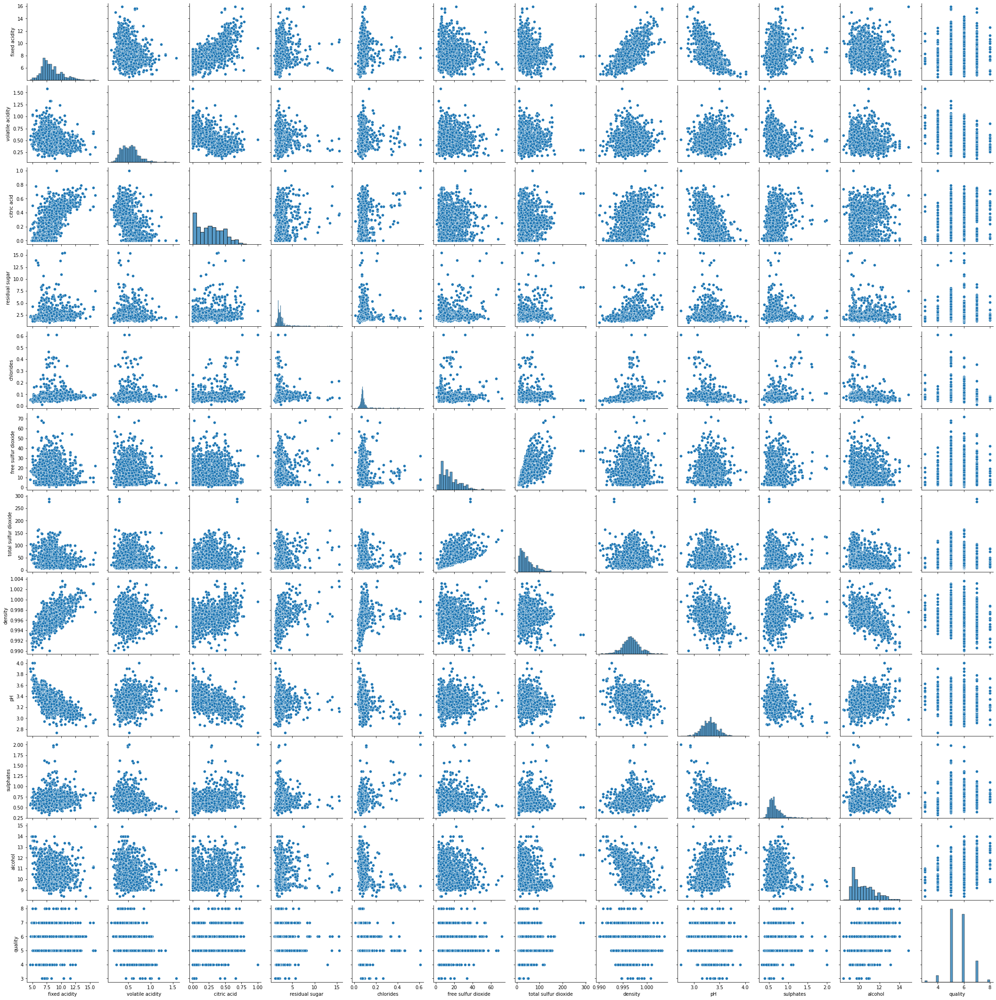

In [11]:
sns.pairplot(df)

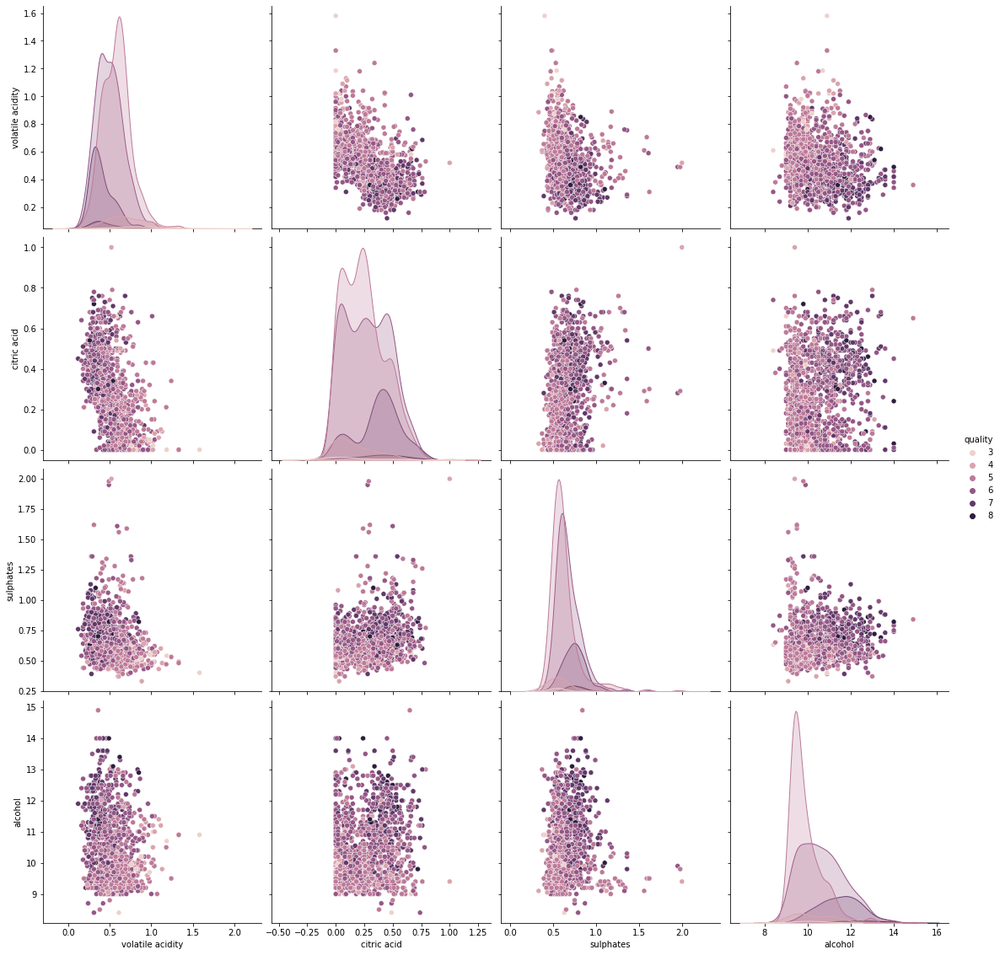

In [12]:
df_s = df[['volatile acidity', 'citric acid', 'sulphates', 'alcohol', 'quality']]
sns.pairplot(df_s, hue='quality', height=4)

# Preprocessing

## Defined X i y

In [13]:
X = df[['volatile acidity', 'citric acid', 'sulphates', 'alcohol']]
y = df['quality']

## Split the set into training and testing

In [100]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [93]:
X_train.head()

,volatile acidity,citric acid,sulphates,alcohol
1031,0.550,0.01,0.58,11.0
844,0.280,0.46,0.83,10.6
38,0.857,0.09,0.48,9.8
1384,0.755,0.15,0.50,9.5
611,0.380,0.55,0.54,9.4


# Decision tree

## Model 1

In [16]:
X1_train = X_train[['alcohol']]

In [17]:
dtr1 = DecisionTreeRegressor()

params = {'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
          'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12],
          'min_samples_split': [3, 4, 5, 6, 7, 8, 9, 10]}

gs1 = GridSearchCV(dtr1, param_grid=params, cv=10)

gs1.fit(X1_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12],
                         'min_samples_split': [3, 4, 5, 6, 7, 8, 9, 10]})

In [18]:
dtr1_best = gs1.best_estimator_
dtr1_best

DecisionTreeRegressor(max_depth=2, min_samples_leaf=5, min_samples_split=3)

In [19]:
gs1.best_score_

0.22340660572513435

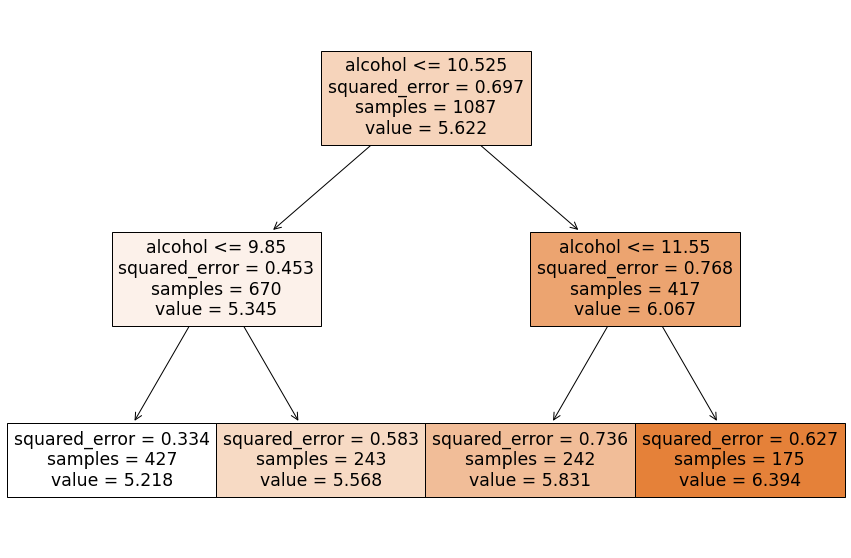

In [20]:
fig = plt.figure(figsize=(15, 10))

tree.plot_tree(dtr1_best, feature_names=dtr1_best.feature_names_in_, filled=True)
plt.show()

In [94]:
X1_fit = np.arange(X1_train.values.min(), X1_train.values.max(), 1)
y1_train_pred = dtr1_best.predict(X1_fit.reshape(-1, 1))

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


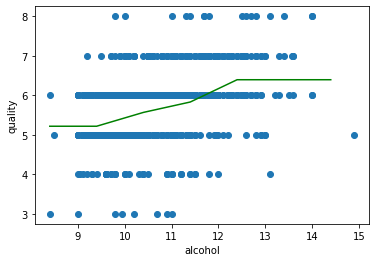

In [95]:
fig, ax = plt.subplots()

ax.scatter(X1_train, y_train)
ax.plot(X1_fit, y1_train_pred, c='g')
plt.xlabel('alcohol')
plt.ylabel('quality')

plt.show()

## Model 2

In [23]:
X2_train = X_train[['alcohol', 'volatile acidity']]

In [24]:
dtr2 = DecisionTreeRegressor()

params = {'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
          'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
          'min_samples_split': [3, 4, 5, 6, 7]}

gs2 = GridSearchCV(dtr2, param_grid=params, cv=10)

gs2.fit(X2_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12, 13,
                                              14],
                         'min_samples_split': [3, 4, 5, 6, 7]})

In [25]:
dtr2_best = gs2.best_estimator_
dtr2_best

DecisionTreeRegressor(max_depth=5, min_samples_leaf=13, min_samples_split=3)

In [26]:
gs2.best_score_

0.2844878707987394

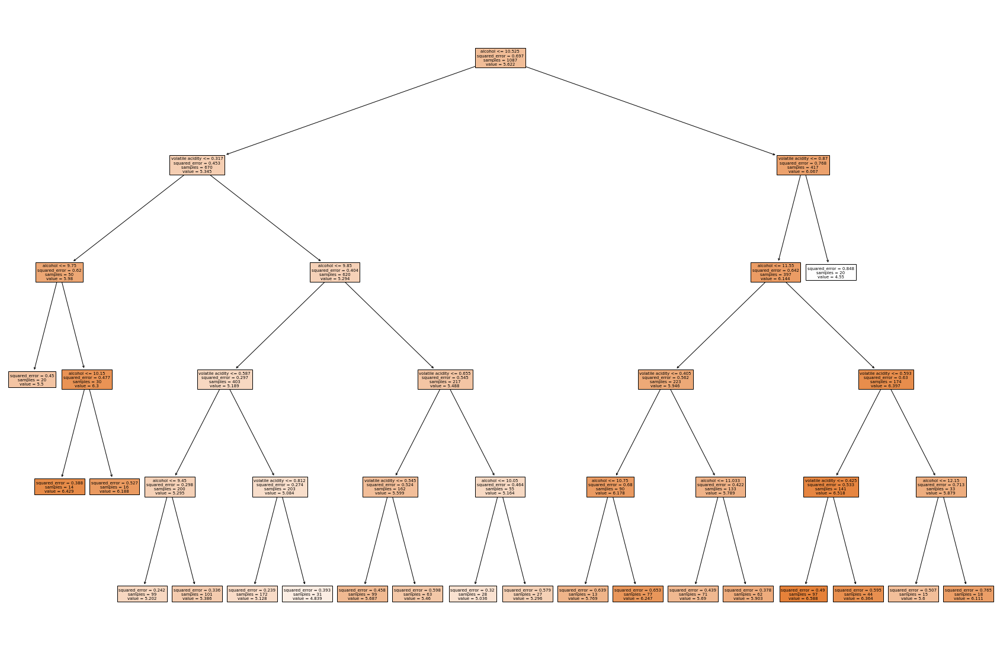

In [27]:
fig = plt.figure(figsize=(30, 20))

tree.plot_tree(dtr2_best, feature_names=dtr2_best.feature_names_in_, filled=True)
plt.show()

In [98]:
dtr2_best.feature_importances_

array([0.63145352, 0.36854648])

In [29]:
X2_train.columns

Index(['alcohol', 'volatile acidity'], dtype='object')

## Model 3

In [30]:
X3_train = X_train[['alcohol', 'volatile acidity', 'sulphates']]

In [31]:
dtr3 = DecisionTreeRegressor()

params = {'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
          'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12],
          'min_samples_split': [3, 4, 5, 6, 7, 8, 9, 10]}

gs3 = GridSearchCV(dtr3, param_grid=params, cv=10)

gs3.fit(X3_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12],
                         'min_samples_split': [3, 4, 5, 6, 7, 8, 9, 10]})

In [32]:
dtr3_best = gs3.best_estimator_
dtr3_best

DecisionTreeRegressor(max_depth=4, min_samples_leaf=8, min_samples_split=9)

In [33]:
gs3.best_score_

0.33802667489418176

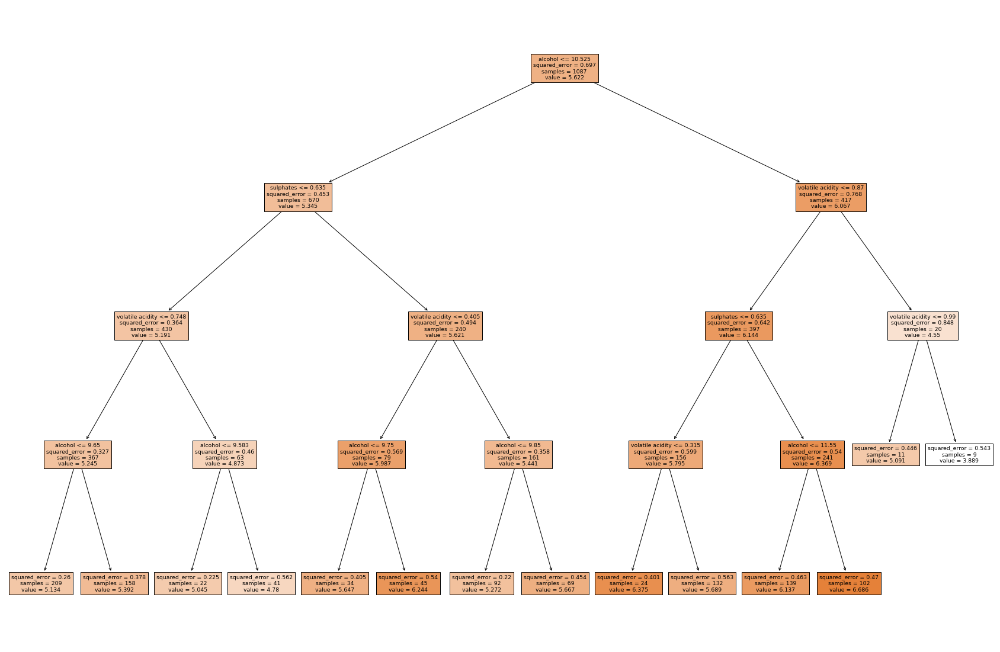

In [34]:
fig = plt.figure(figsize=(30, 20))

tree.plot_tree(dtr3_best, feature_names=dtr3_best.feature_names_in_, filled=True)
plt.show()

In [97]:
dtr3_best.feature_importances_

array([0.53734229, 0.27597205, 0.18668566])

In [36]:
X3_train.columns

Index(['alcohol', 'volatile acidity', 'sulphates'], dtype='object')

## Model 4

In [101]:
X4_train = X_train.copy()

In [102]:
X4_train

,volatile acidity,citric acid,sulphates,alcohol
1031,0.550,0.01,0.58,11.0
844,0.250,0.46,0.83,10.6
38,1.130,0.09,0.48,9.8
1384,0.755,0.15,0.50,9.5
611,0.380,0.55,0.54,9.4
...,...,...,...,...
828,0.570,0.09,0.74,12.7
1063,0.290,0.65,0.63,11.8
1286,0.160,0.44,0.54,12.4
267,0.350,0.46,0.86,12.8


In [104]:
dtr4 = DecisionTreeRegressor()

params = {'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
          'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12],
          'min_samples_split': [3, 4, 5, 6, 7, 8, 9, 10]}

gs4 = GridSearchCV(dtr4, param_grid=params, cv=10)

gs4.fit(X4_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12],
                         'min_samples_split': [3, 4, 5, 6, 7, 8, 9, 10]})

In [105]:
dtr4_best = gs4.best_estimator_
dtr4_best

DecisionTreeRegressor(max_depth=4, min_samples_leaf=8, min_samples_split=4)

In [106]:
gs4.best_score_

0.33628115715865914

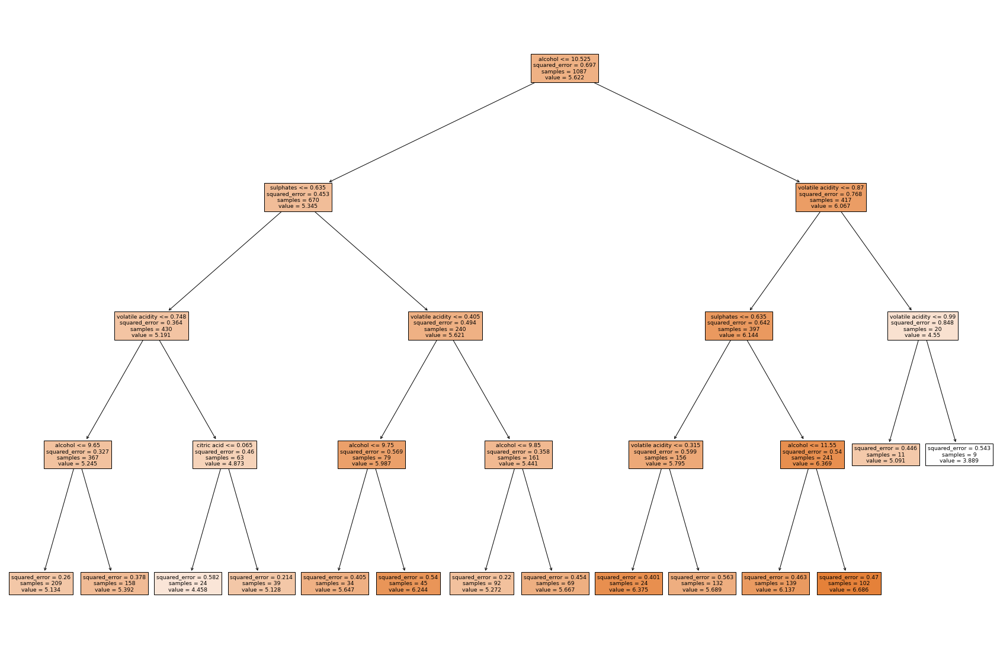

In [107]:
fig = plt.figure(figsize=(30, 20))

tree.plot_tree(dtr4_best, feature_names=dtr4_best.feature_names_in_, filled=True)
plt.show()

In [108]:
dtr4_best = gs4.best_estimator_
dtr4_best.feature_importances_

array([0.27117476, 0.02046955, 0.18344046, 0.52491523])

In [109]:
X4_train.columns

Index(['volatile acidity', 'citric acid', 'sulphates', 'alcohol'], dtype='object')

# Regression

## Outliers

In [110]:
X_train_bo = X_train.copy()
X_train_bo.describe()

,volatile acidity,citric acid,sulphates,alcohol
count,1087.000000,1087.000000,1087.000000,1087.000000
mean,0.530492,0.272521,0.655097,10.429653
std,0.185042,0.194997,0.165650,1.068624
min,0.120000,0.000000,0.330000,8.400000
25%,0.390000,0.100000,0.550000,9.500000
50%,0.520000,0.260000,0.620000,10.200000
75%,0.640000,0.430000,0.720000,11.100000
max,1.580000,0.790000,1.980000,14.900000


In [111]:
for column in X_train_bo.columns:
  upper_percentile = X_train_bo[column].quantile(0.95)
  lower_percentile = X_train_bo[column].quantile(0.05)

  X_train_bo[column] = np.where(X_train_bo[column] <= upper_percentile,
                                X_train_bo[column],
                                upper_percentile)
  
  X_train_bo[column] = np.where(X_train_bo[column] >= lower_percentile,
                                X_train_bo[column], 
                                lower_percentile)

In [112]:
X_train_bo.describe()

,volatile acidity,citric acid,sulphates,alcohol
count,1087.000000,1087.00000,1087.000000,1087.000000
mean,0.526647,0.26885,0.645446,10.410871
std,0.164418,0.18768,0.125958,0.996588
min,0.280000,0.00000,0.470000,9.200000
25%,0.390000,0.10000,0.550000,9.500000
50%,0.520000,0.26000,0.620000,10.200000
75%,0.640000,0.43000,0.720000,11.100000
max,0.857000,0.60000,0.930000,12.500000


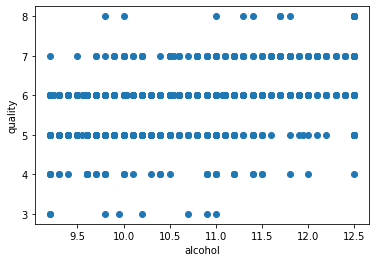

In [113]:
fig, ax = plt.subplots()

ax.scatter(X_train_bo['alcohol'], y_train)
plt.xlabel('alcohol')
plt.ylabel('quality')

plt.show()

## Standardization

In [114]:
sc_x = StandardScaler()
sc_y = StandardScaler()

X_train_sc = pd.DataFrame(sc_x.fit_transform(X_train_bo), columns=['volatile acidity', 'citric acid', 'sulphates', 'alcohol'])
y_train_sc = sc_y.fit_transform(y_train.values.reshape(-1, 1))

## Model 1

In [115]:
X1_train_sc = X_train_sc[['alcohol']]

In [116]:
X1_train_sc

,alcohol
0,0.591418
1,0.189864
2,-0.613244
3,-0.914410
4,-1.014798
...,...
1082,2.097246
1083,1.394526
1084,1.996857
1085,2.097246


In [117]:
lr_1 = LinearRegression()
lr_1.fit(X1_train_sc, y_train_sc)

LinearRegression()

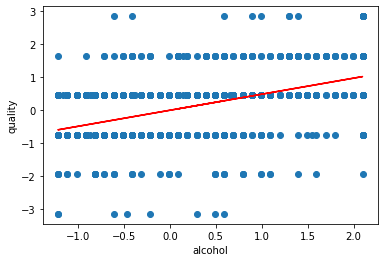

In [118]:
fig, ax = plt.subplots()

ax.scatter(X1_train_sc, y_train_sc)
ax.plot(X1_train_sc, lr_1.predict(X1_train_sc), c='r')

plt.xlabel('alcohol')
plt.ylabel('quality')
plt.show()

## Model 1A

In [119]:
pipe = Pipeline([('poly', PolynomialFeatures()), ('lr_1A', LinearRegression())])

params = {'poly__degree': [2, 3, 4, 5]}

gs_r1 = GridSearchCV(pipe, param_grid=params, cv=10)

gs_r1.fit(X1_train_sc, y_train_sc)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('poly', PolynomialFeatures()),
                                       ('lr_1A', LinearRegression())]),
             param_grid={'poly__degree': [2, 3, 4, 5]})

In [120]:
gs_r1.best_estimator_

Pipeline(steps=[('poly', PolynomialFeatures()), ('lr_1A', LinearRegression())])

In [121]:
gs_r1.best_params_

{'poly__degree': 2}

In [122]:
gs_r1.best_score_

0.22809811682264297

## Model 2

In [125]:
X2_train_sc = X_train_sc[['alcohol', 'volatile acidity']]

In [126]:
X2_train_sc

,alcohol,volatile acidity
0,0.591418,0.142101
1,0.189864,-1.500812
2,-0.613244,2.010155
3,-0.914410,1.389499
4,-1.014798,-0.892326
...,...,...
1082,2.097246,0.263799
1083,1.394526,-1.439964
1084,1.996857,-1.500812
1085,2.097246,-1.074872


In [127]:
pipe = Pipeline([('poly', PolynomialFeatures()), ('lr_2', LinearRegression())])

params = {'poly__degree': [1, 2, 3, 4, 5]}

gs_r2 = GridSearchCV(pipe, param_grid=params, cv=10)

gs_r2.fit(X2_train_sc, y_train_sc)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('poly', PolynomialFeatures()),
                                       ('lr_2', LinearRegression())]),
             param_grid={'poly__degree': [1, 2, 3, 4, 5]})

In [128]:
gs_r2.best_estimator_

Pipeline(steps=[('poly', PolynomialFeatures(degree=3)),
                ('lr_2', LinearRegression())])

In [129]:
gs_r2.best_score_

0.3236683620545541

## Model 3

In [130]:
X3_train_sc = X_train_sc[['alcohol', 'volatile acidity', 'sulphates']]

In [131]:
X3_train_sc

,alcohol,volatile acidity,sulphates
0,0.591418,0.142101,-0.519828
1,0.189864,-1.500812,1.465879
2,-0.613244,2.010155,-1.314111
3,-0.914410,1.389499,-1.155254
4,-1.014798,-0.892326,-0.837541
...,...,...,...
1082,2.097246,0.263799,0.751025
1083,1.394526,-1.439964,-0.122686
1084,1.996857,-1.500812,-0.837541
1085,2.097246,-1.074872,1.704164


In [132]:
pipe = Pipeline([('poly', PolynomialFeatures()), ('lr_3', LinearRegression())])

params = {'poly__degree': [1, 2, 3, 4, 5]}

gs_r3 = GridSearchCV(pipe, param_grid=params, cv=10)

gs_r3.fit(X3_train_sc, y_train_sc)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('poly', PolynomialFeatures()),
                                       ('lr_3', LinearRegression())]),
             param_grid={'poly__degree': [1, 2, 3, 4, 5]})

In [133]:
gs_r3.best_estimator_

Pipeline(steps=[('poly', PolynomialFeatures(degree=3)),
                ('lr_3', LinearRegression())])

In [134]:
gs_r3.best_score_

0.37919051279305577

## Model 4

In [135]:
X4_train_sc = X_train_sc.copy()

In [136]:
X4_train_sc

,volatile acidity,citric acid,sulphates,alcohol
0,0.142101,-1.379847,-0.519828,0.591418
1,-1.500812,1.018960,1.465879,0.189864
2,2.010155,-0.953393,-1.314111,-0.613244
3,1.389499,-0.633552,-1.155254,-0.914410
4,-0.892326,1.498721,-0.837541,-1.014798
...,...,...,...,...
1082,0.263799,-0.953393,0.751025,2.097246
1083,-1.439964,1.765255,-0.122686,1.394526
1084,-1.500812,0.912346,-0.837541,1.996857
1085,-1.074872,1.018960,1.704164,2.097246


In [137]:
pipe = Pipeline([('poly', PolynomialFeatures()), ('lr_4', LinearRegression())])

params = {'poly__degree': [1, 2, 3, 4, 5]}

gs_r4 = GridSearchCV(pipe, param_grid=params, cv=10)

gs_r4.fit(X4_train_sc, y_train_sc)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('poly', PolynomialFeatures()),
                                       ('lr_4', LinearRegression())]),
             param_grid={'poly__degree': [1, 2, 3, 4, 5]})

In [138]:
gs_r4.best_estimator_

Pipeline(steps=[('poly', PolynomialFeatures(degree=3)),
                ('lr_4', LinearRegression())])

In [78]:
gs_r4.best_score_

0.37689188350495817

# Checking the results on the test set for the reggression model number 3

In [139]:
X_test_bo = X_test.copy()

In [140]:
for column in X_train_bo.columns:
  upper_percentile = X_train[column].quantile(0.95)
  lower_percentile = X_train[column].quantile(0.05)
  
  X_test_bo[column] = np.where(X_test_bo[column] <= upper_percentile, X_test_bo[column], upper_percentile)
  X_test_bo[column] = np.where(X_test_bo[column] >= lower_percentile, X_test_bo[column], lower_percentile)

In [141]:
X_test_bo.describe()

,volatile acidity,citric acid,sulphates,alcohol
count,272.000000,272.000000,272.000000,272.000000
mean,0.523776,0.266912,0.659228,10.419792
std,0.158096,0.187829,0.132931,1.041424
min,0.280000,0.000000,0.470000,9.200000
25%,0.397500,0.080000,0.560000,9.500000
50%,0.515000,0.255000,0.620000,10.100000
75%,0.630000,0.420000,0.750000,11.100000
max,0.857000,0.600000,0.930000,12.500000


In [142]:
X_test_sc = sc_x.transform(X_test_bo)
y_test_sc = sc_y.transform(y_test.values.reshape(-1, 1))

In [143]:
X_test_sc

array([[-1.07487167,  1.49872109,  1.14816616,  0.18986392],
       [ 2.01015529, -0.36701772, -1.3935389 , -0.41246725],
       [-1.50081228, -0.15379043,  0.11559848,  2.09724595],
       ...,
       [ 0.93313404, -0.95339278, -0.99639749,  0.69180656],
       [ 0.68973941, -0.52693819, -1.15525405, -0.91440989],
       [-1.37911496,  1.12557333,  1.06873788, -0.11130166]])

In [144]:
X3_test_sc = pd.DataFrame(X_test_sc, columns=['volatile acidity', 'citric acid', 'sulphates', 'alcohol'])
X3_test_sc = X3_test_sc[['alcohol', 'volatile acidity', 'sulphates']]

In [145]:
X3_test_sc

,alcohol,volatile acidity,sulphates
0,0.189864,-1.074872,1.148166
1,-0.412467,2.010155,-1.393539
2,2.097246,-1.500812,0.115598
3,-0.111302,-1.257418,1.386451
4,-1.014798,0.081253,2.101306
...,...,...,...
267,0.340447,1.997986,-0.678684
268,-1.215575,0.142101,-1.314111
269,0.691807,0.933134,-0.996397
270,-0.914410,0.689739,-1.155254


In [146]:
gs_r3.score(X3_test_sc, y_test_sc)

0.3175936234890886